# 20.10 Электрический импеданс боковых электродных сборок: индивидуальная геометрия, обратная задача и обоснование упрощённых моделей

**Место в последовательности:** [карта проекта](00.00_Карта_проекта.md) →
[20.01–20.04: КТ и исходные свойства](20.10_КТ_FEM_локализация_боковых_матриц_МГТУ.md#входы-и-происхождение) → **20.10: данный отчёт** →
[20.11: чувствительность](20.11_КТ_FEM_чувствительность_боковых_сборок.ipynb) →
[20.12: применимость упрощённых моделей](20.12_Критерий_Lmax_плоскослоистой_модели.ipynb) →
[32: выбор размеров](32.02_Выбор_пары_при_известной_h.ipynb).
Аналитическая основа: [30.01](30.01_Прямая_двуслойная_модель_боковой_сборки.md)
и [30.04](30.04_Вычислительное_ядро_двуслойной_модели.ipynb).
[Паспорт этапа](20.10_КТ_FEM_локализация_боковых_матриц_МГТУ.md) определяет входы,
выходы и статус передачи результата. Нумерация задаёт порядок исследования;
численные результаты не становятся принятыми входами следующих этапов автоматически.

**Текущее состояние исследования.** В [разделе 20](#saved-scan-study) анализируется сохранённая часть многоразмерного перебора: 475 090 допустимых рассчитанных FEM-поз из 1 590 841 запрошенной позы. Обработаны 19 200 центров; 803 641 поза ещё не проверена. Минимум сохранённой части имеет RMSE 2,882 Ом и обозначен C01. Это дискретный численный кандидат при фиксированных сопротивлениях, а не независимо зарегистрированная фактическая установка; завершённость полного перебора и физическая валидация не установлены.

## Аннотация

Рассматривается связь между передаточным электрическим импедансом четырёхэлектродной боковой сборки, её размером и пространственным распределением тканей грудной клетки. Исходными данными служат индивидуальная компьютерная томография (КТ) на вдохе, полученные по ней поверхности анатомических областей и девять значений импеданса, зарегистрированных последовательно при разных размерах сборки. Исследование относится к этапу разработки методики эксперимента 2, выполненного на реокардиомониторе МГТУ. Рассматривается один доброволец; перенос результатов на другие сессии, приборы и испытуемых требует отдельной проверки.

Отчёт объединяет четыре связанные задачи. Первая состоит в построении прямой трёхмерной модели и описании локального кандидата совместной оценки двух удельных сопротивлений и общей позы сборок. Вторая состоит в проверке геометрических величин, которыми реальная анатомия может быть представлена в аналитической модели. Третья состоит в сравнении десяти вариантов прямого расчёта при фиксированных параметрах и в формулировке программы выбора вычислительно экономного приближения. Четвёртая состоит в локализации сборки по сохранённой части полного перебора при фиксированных сопротивлениях и в проверке общего двуслойного приближения для каждой готовой FEM-кривой.

В исходном конечноэлементном расчёте мягкие ткани и лёгкое имеют подбираемые сопротивления, а сердце и кости представлены отдельными областями с фиксированными проводимостями. В специальном сравнении раздела 11.3.1 по решению автора используются **ровно два материала**: лёгкое и объединённая область остальных тканей. В последнюю входят грудная стенка, кости, сердце и ткани ниже диафрагмы. Трёхслойное представление в этой постановке означает последовательность «мягкие ткани — лёгкое — мягкие ткани» с одинаковыми свойствами первого и третьего слоёв.

Полученный результат является вычислительным исследованием моделей. Для документированного примера усреднение глубины по парам электродов даёт среднеквадратичное расхождение с двухтканным трёхмерным расчётом около 5,68 Ом; включение конечной толщины первого лёгочного интервала в такую схему увеличивает его до 6,32 Ом. Следовательно, увеличение числа геометрических характеристик в эвристической формуле само по себе не обеспечивает повышения точности. В то же время контролируемое продолжение лёгочной области в трёхмерной модели изменяет импеданс на 0,47–3,43 Ом. Эти числа характеризуют конкретную геометрию и фиксированные параметры; оптимальное упрощение ещё не установлено.

**Назначение результата в общей методике.** Боковые сборки предназначены для исследования эффективных тканевых вкладов, которые в дальнейшем предполагается учитывать при интерпретации тетраполярной трансторакальной реокардиографии (ТТРКГ). В настоящем отчёте ударный объём и фракция выброса не рассчитываются. Выбор окончательного сокращённого протокола без индивидуальной КТ остаётся последующим этапом.

**Структура.** Разделы 1–6 задают физическую и геометрическую постановку; разделы 7–10 рассматривают обратную задачу и её ограничения; раздел 11 содержит аналитические модели и их численное сопоставление; разделы 12–17 описывают особенности размерного ряда, вычислительную историю и дыхательные состояния; разделы 18–19 формулируют программу редукции и критерии выбора; раздел 20 содержит результаты сохранённого многоразмерного перебора и проверку их устойчивости; разделы 21–22 — итоговые положения и методические источники. Идентификаторы расчётов и технические сведения сохраняются в сопроводительных таблицах для проверки происхождения чисел.

**Согласование с 20.16 от 14.09.2026.** Определения геометрии и прямое сравнение в 11.3.1–11.4 используют выбранный C01 и тот же повторно рассчитанный двухтканный набор, что и 20.16. Ранний пример другого положения сохранён отдельно в 11.5.

## Исследовательская постановка и происхождение входных данных

### Обозначения методов и форматов данных

В тексте используется метод конечных элементов (МКЭ); обозначение FEM в коде и таблицах соответствует английскому *finite element method*. Полная электродная модель обозначается CEM (*complete electrode model*), точечная — PEM (*point electrode model*). Это обозначения моделей контакта; они не задают самостоятельного типа ткани.

DICOM — формат исходных томографических изображений и метаданных; STL — формат треугольных поверхностей. HU обозначает единицы Хаунсфилда, в которых выражается рентгеновская плотность КТ. RMS или RMSE — среднеквадратичная величина остатка, MAE — среднее абсолютное значение остатка. SVD означает сингулярное разложение матрицы. Геометрические координаты в исходных данных заданы в миллиметрах, а уравнения проводимости решаются после перевода длин в метры.



Измеряемой величиной является разность потенциалов двух измерительных электродов, отнесённая к току через два токовых электрода. Для каждой сборки используется номинальный размер между токовыми электродами. Изменение этого размера меняет пространственное распределение чувствительности; оно не задаёт единственную глубину проникновения тока и не выделяет отдельную ткань без расчёта поля.

| Вход или параметр | Происхождение | Роль в расчёте и предел интерпретации |
|---|---|---|
| КТ на вдохе | Непосредственно зарегистрированная томографическая серия | Источник анатомической геометрии и, при доступности DICOM, значений рентгеновской плотности |
| Анатомические маски | Ручная сегментация автором в Inobitec и последующая вычислительная обработка | Геометрическая модель тканей; граница маски содержит неопределённость сегментации и обработки |
| Поверхности и объёмная сетка | Растеризация, восстановление замкнутых поверхностей и тетраэдрализация | Дискретное представление расчётной области; не дополнительное анатомическое измерение |
| Импеданс на задержке вдоха | Агрегированные уровни экспериментальных записей | Девять наблюдений для сравнения и подбора параметров |
| Границы дыхательных интервалов | Ретроспективная реконструкция по протоколу и сигналам | Экспертная разметка; приборные метки команд дыхания отсутствуют |
| Номинальные размеры сборок | Геометрия экспериментального монтажа и субъектный манифест | Размерный ряд 50, 60, 70, 80, 90, 110, 120, 130 и 140 мм |
| Общий центр и ориентация | Параметризация расчёта; уточнение по импедансу | Модельная оценка позы, а не независимая КТ-регистрация всех установок |
| Удельные сопротивления | Подбор в принятой прямой модели либо перенос из этого подбора в сравнение | Эффективные параметры конкретной постановки |
| Площадь и свойства контакта | Принятые параметры полной электродной модели | Неизмеренные индивидуально характеристики каждой установки |

Для данного добровольца запись 100 мм является поздней перезаписанной копией записи 90 мм. В анализ включена запись 90 мм. Под девятью самостоятельными записями далее понимается отсутствие указанного файлового дубликата; статистическая независимость ошибок из этого не следует. Другому добровольцу такое исключение автоматически не назначается.

Размеры регистрировались последовательно. Их объединение в одну зависимость импеданса от размера опирается на допущение сопоставимости физиологического состояния между записями. Межзаписная изменчивость состояния, повторное наложение электродов и индивидуальные особенности контакта могут быть связаны с порядком измерений. Одно агрегированное значение на размер не позволяет оценить все эти компоненты раздельно. Численные выходы прибора принимаются в указанных физических единицах согласно рабочему решению автора; дополнительные произвольные коэффициенты усиления или смещения в данном анализе не вводятся.

Для научной интерпретации различаются четыре уровня утверждений: **наблюдение** в исходных данных; **допущение** при построении модели; **результат математического расчёта**; **положение, требующее дальнейшей проверки**. Внутренняя согласованность уравнений и воспроизводимость чисел относятся к проверке расчёта. Экспериментальная пригодность тканевых оценок и возможность исключения КТ требуют независимых данных.

## 1. Физическая постановка и математическая модель

### 1.1. Квазистатическое приближение и материальные свойства

Расчётная область представляет проводящий объём тела, ограниченный наружной поверхностью. Предполагаются линейность электрического отклика, отсутствие внутренних источников задаваемого измерительного тока и кусочная однородность материальных свойств. Рабочая частота конфигурации составляет 50 кГц. Переход к квазистатике исключает необходимость моделировать распространение электромагнитной волны в рассматриваемой постановке, но сам по себе не устраняет диэлектрическую составляющую проводимости.

В общем гармоническом случае уравнение записывается через комплексную удельную проводимость:

$$
\nabla\cdot(\gamma\nabla\psi)=0,\qquad
\gamma=\sigma+\mathrm i\omega\varepsilon,\qquad \omega=2\pi f,
$$
где $\psi$ — комплексная амплитуда потенциала, В; $\gamma$ — комплексная удельная проводимость, См/м; $\sigma$ — её активная составляющая, См/м; $\varepsilon$ — абсолютная диэлектрическая проницаемость, Ф/м; $f$ — частота, Гц; $\omega$ — круговая частота, с$^{-1}$; $\mathrm i$ — мнимая единица; $\nabla$ — оператор пространственного дифференцирования.

В исполняемом расчёте принято дополнительное **скалярное вещественное приближение**: используется активная проводимость, равная обратному удельному сопротивлению. Фаза, частотная дисперсия и анизотропия не идентифицируются. Это ограничивает физический смысл найденных параметров условиями данного расчёта.

Двухтканное поле проводимости определяется следующим образом:

$$
\sigma(\mathbf x)=
\begin{cases}
1/\rho_2,&\mathbf x\in\Omega_{\mathrm{л}},\\
1/\rho_1,&\mathbf x\in\Omega\setminus\Omega_{\mathrm{л}},
\end{cases}
\qquad \rho_1>0,\quad\rho_2>0,
$$
где $\mathbf x$ — пространственная координата, м; $\Omega$ — весь расчётный объём тела; $\Omega_{\mathrm{л}}$ — лёгочная область; $\rho_1$ и $\rho_2$ — удельные сопротивления объединённой мягкотканной и лёгочной областей, Ом·м; $\sigma$ — удельная проводимость, См/м.

В исходной четырёхтканной модели поверх фонового распределения дополнительно назначаются фиксированные проводимости масок сердца и костей. Отдельная маска крови отсутствует. Эта модель используется для описания исходного кандидата обратной задачи. Основное сравнение упрощений в разделе 11.3.1 выполняется с указанной выше двухтканной моделью.

### 1.2. Условия на внутренних и наружной границах

На идеальном контакте двух тканевых областей непрерывны потенциал и нормальная составляющая проводимого тока:

$$
\psi_1=\psi_2,\qquad
\sigma_1\nabla\psi_1\cdot\mathbf n_{12}
=\sigma_2\nabla\psi_2\cdot\mathbf n_{12},
$$
где индексы 1 и 2 обозначают значения с двух сторон границы; $\psi_j$ — потенциал, В; $\sigma_j$ — проводимость, См/м; $\mathbf n_{12}$ — одна и та же выбранная единичная нормаль к границе. Использование общей нормали необходимо для согласования знака потока.

На поверхности тела вне электродов задаётся отсутствие нормального тока. На электродах используется полная электродная модель, учитывающая конечную площадь и контактное сопротивление [Staboulis и Dardé](https://arxiv.org/abs/1312.4202):

$$
\psi+z_\ell\sigma\frac{\partial\psi}{\partial n}=U_\ell
\quad\text{на }E_\ell,\qquad
\int_{E_\ell}\sigma\frac{\partial\psi}{\partial n}\,dS=I_\ell,
\qquad \sum_\ell I_\ell=0,
$$
где $E_\ell$ — поверхность электрода с номером $\ell$; $U_\ell$ — его постоянный потенциал, В; $z_\ell$ — удельный контактный импеданс, Ом·м²; $I_\ell$ — заданный ток, А, положительный при вводе в тело; $n$ — внешняя нормаль тела; $dS$ — элемент площади, м²; $\psi$ и $\sigma$ определены выше. Физическая плотность тока равна $-\sigma\nabla\psi$, поэтому выбранный знак $I_\ell$ согласован с током, входящим в область.

Потенциал определён с точностью до общей константы. Для единственности решения задаётся опорный потенциал либо условие нулевой суммы электродных потенциалов. Измеряемые разности не должны зависеть от допустимого выбора этой константы. Нулевой суммарный ток измерительного электрода не означает тождественно нулевой локальный ток в каждой точке его поверхности: металлический контакт остаётся эквипотенциальным.

### 1.3. Геометрия сборки и измеряемый функционал

Номинальное положение четырёх центров строится относительно общего центра и касательной оси, после чего точки проецируются на наружную поверхность:

$$
\widetilde{\mathbf r}_e=\mathbf c+q_eL\mathbf a_\varphi,
\qquad \mathbf r_e=\Pi_{\partial\Omega}(\widetilde{\mathbf r}_e),
\qquad (q_A,q_M,q_N,q_B)=(-1/2,-1/4,1/4,1/2),
$$
где $\mathbf c$ — общий центр, $L$ — номинальное расстояние между токовыми электродами, $\mathbf a_\varphi$ — единичная касательная ось после поворота на угол $\varphi$, $q_e$ — безразмерное смещение электрода, $\Pi_{\partial\Omega}$ — проекция на поверхность тела, $A,B$ — токовые, $M,N$ — измерительные электроды. Геометрия хранится в миллиметрах и переводится в метры перед решением уравнений.

Расчётный передаточный импеданс равен

$$
Z=\frac{U_M-U_N}{I},\qquad (I_A,I_M,I_N,I_B)=(I,0,0,-I),
$$
где $Z$ измеряется в омах; $U_M,U_N$ — потенциалы измерительных электродов, В; $I$ — амплитуда задаваемого тока, А. В линейном решателе используется нормировка на 1 А; она не является утверждением о токе экспериментального прибора.

Номинальная контактная площадь одного электрода составляет около 70,69 мм² и задана как 90 % площади диска диаметром 10 мм. Контактный импеданс принимается одинаковым для всех площадок. Фактическая площадь дискретного электрода определяется индуцированными граничными гранями и проверяется отдельно. Указанные контактные характеристики являются входными допущениями.

### 1.4. Слабая форма и контроль физических тождеств

При положительных проводимостях и контактных импедансах слабая форма имеет вид

$$
\int_\Omega\sigma\nabla\psi\cdot\nabla v\,dV
+\sum_\ell\frac1{z_\ell}\int_{E_\ell}(\psi-U_\ell)(v-V_\ell)\,dS
=\sum_\ell I_\ell V_\ell,
$$
где $v$ и $V_\ell$ — пробные объёмный и электродные потенциалы; $dV$ — элемент объёма, м³; остальные величины определены в предыдущих подпунктах. Совместная фиксация опорного уровня устраняет постоянную нулевую моду системы.

Подстановка решения в качестве пробной функции даёт неотрицательную суммарную мощность диссипации. Симметрия билинейной формы приводит к взаимности при перестановке токовой и измерительной пар. Эти свойства проверяют согласованность прямого оператора. Они не устанавливают точность сегментации и не доказывают, что найденные эффективные сопротивления являются истинными свойствами тканей. Знак отдельного передаточного импеданса определяется монтажом; его нельзя отождествлять со знаком полной рассеиваемой мощности.

In [1]:
from pathlib import Path
import hashlib
import json
import os
import warnings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from IPython.display import display, HTML, Markdown
import plotly.graph_objects as go
import pydicom
from scipy.interpolate import RegularGridInterpolator
from scipy.optimize import least_squares
from scipy.spatial import cKDTree
from scipy.sparse import coo_matrix
from scipy.sparse.csgraph import connected_components
from stl import mesh as stl_mesh

warnings.filterwarnings('ignore', category=UserWarning)
plt.style.use('seaborn-v0_8-whitegrid')
pd.set_option('display.max_columns', 50)
pd.set_option('display.precision', 5)

# Store Plotly figures as ordinary HTML outputs.  The first figure embeds
# plotly.js, so the exported report remains interactive without internet.
_plotly_js_embedded = False
def show_plotly(figure):
    global _plotly_js_embedded
    display(HTML(figure.to_html(
        full_html=False,
        include_plotlyjs=True if not _plotly_js_embedded else False,
    )))
    _plotly_js_embedded = True

_working_dir = Path.cwd().resolve()
_model_candidates = (
    _working_dir / 'MATLAB_TRKG4_real_subjects',
    _working_dir.parent / 'MATLAB_TRKG4_real_subjects',
    _working_dir,
    _working_dir.parent,
)
ROOT = next((p for p in _model_candidates if (p / 'output').is_dir()), None)
if ROOT is None:
    raise FileNotFoundError('Не найден расчётный каталог MATLAB_TRKG4_real_subjects/output')
OUT = ROOT / 'output'
STL = ROOT / 'data' / 'nik' / 'stl'
dicom_env = os.environ.get('KALMYKOV_DICOM_DIR', '').strip()
DICOM_DIR = Path(dicom_env) if dicom_env else None

# The report follows the result set selected by the executor.  Keep the
# current result as the default, but make a different validated result set
# selectable without editing this source.
result_tag = os.environ.get(
    'TRKG4_RESULT_TAG', 'auditfix_20260908').strip()
if not result_tag:
    raise ValueError('TRKG4_RESULT_TAG must be a non-empty result tag')
rejected_result_tag = 'v5_1mm_local2mm'
baseline_summary_file = OUT / 'nik_trkg4_inverse_inhale_fit_summary.csv'
baseline_comparison_file = OUT / 'nik_trkg4_inverse_inhale_comparison.csv'
baseline_available = baseline_summary_file.is_file() and baseline_comparison_file.is_file()
baseline_summary = pd.read_csv(baseline_summary_file).iloc[0] if baseline_available else None
baseline_comparison = pd.read_csv(baseline_comparison_file) if baseline_available else None
pre_rerun_dir = OUT / 'repro_check_20260901_before'
pre_rerun_summary_file = pre_rerun_dir / f'nik_trkg4_inverse_inhale_fit_summary_{rejected_result_tag}.csv'
pre_rerun_comparison_file = pre_rerun_dir / f'nik_trkg4_inverse_inhale_comparison_{rejected_result_tag}.csv'
pre_rerun_available = pre_rerun_summary_file.is_file() and pre_rerun_comparison_file.is_file()
pre_rerun_summary = (
    pd.read_csv(pre_rerun_summary_file).iloc[0] if pre_rerun_available else None)
pre_rerun_comparison = (
    pd.read_csv(pre_rerun_comparison_file) if pre_rerun_available else None)
legacy_patch_tags = {
    'earliest': 'repro_oldpoint_legacy_patch',
    'reconstructed_fast': 'repro_oldpoint_legacy_fast_patch',
}
legacy_patch_files = {
    key: {
        'summary': OUT / f'nik_trkg4_inverse_inhale_fit_summary_{tag}.csv',
        'comparison': OUT / f'nik_trkg4_inverse_inhale_comparison_{tag}.csv',
        'electrodes': OUT / f'nik_trkg4_inverse_inhale_electrodes_{tag}.csv',
        'history': OUT / f'nik_trkg4_inverse_inhale_history_{tag}.csv',
    }
    for key, tag in legacy_patch_tags.items()
}
pre_rerun_electrodes_file = pre_rerun_dir / (
    f'nik_trkg4_inverse_inhale_electrodes_{rejected_result_tag}.csv')
legacy_patch_available = (
    pre_rerun_electrodes_file.is_file()
    and all(path.is_file() for group in legacy_patch_files.values()
            for path in group.values()))
if legacy_patch_available:
    legacy_patch_summary = {
        key: pd.read_csv(paths['summary']).iloc[0]
        for key, paths in legacy_patch_files.items()}
    legacy_patch_comparison = {
        key: pd.read_csv(paths['comparison'])
        for key, paths in legacy_patch_files.items()}
    legacy_patch_electrodes = {
        key: pd.read_csv(paths['electrodes'])
        for key, paths in legacy_patch_files.items()}
    legacy_patch_history = {
        key: pd.read_csv(paths['history'])
        for key, paths in legacy_patch_files.items()}
primary_files = {
    'summary': OUT / f'nik_trkg4_inverse_inhale_fit_summary_{result_tag}.csv',
    'comparison': OUT / f'nik_trkg4_inverse_inhale_comparison_{result_tag}.csv',
    'depth': OUT / f'nik_trkg4_inverse_inhale_depth_curve_{result_tag}.csv',
    'electrodes': OUT / f'nik_trkg4_inverse_inhale_electrodes_{result_tag}.csv',
    'grid_geometry': OUT / f'nik_trkg4_inverse_inhale_grid_geometry_{result_tag}.csv',
    'parameter_sensitivity': OUT / f'nik_trkg4_inverse_inhale_parameter_sensitivity_{result_tag}.csv',
    'history': OUT / f'inverse_inhale_history_{result_tag}.csv',
    'matlab_history': OUT / f'nik_trkg4_inverse_inhale_history_{result_tag}.csv',
    'driver_history': OUT / f'nik_trkg4_inverse_direct_search_history_{result_tag}.csv',
    'direct_history': OUT / f'inverse_direct_search_history_{result_tag}.csv',
    'jacobian': OUT / f'nik_trkg4_inverse_inhale_jacobian_{result_tag}.csv',
    'jacobian_diagnostics': OUT / f'nik_trkg4_inverse_inhale_jacobian_diagnostics_{result_tag}.json',
    'contract': OUT / f'nik_trkg4_inverse_inhale_contract_{result_tag}.json',
}
missing_primary = [str(path) for key, path in primary_files.items()
                   if key not in ('history', 'matlab_history', 'driver_history', 'direct_history', 'jacobian',
                                  'jacobian_diagnostics', 'contract')
                   and not path.is_file()]
if missing_primary:
    raise FileNotFoundError(
        'У выбранного result_tag отсутствуют основные CSV: '
        + ', '.join(missing_primary))

summary = pd.read_csv(primary_files['summary']).iloc[0]
comparison = pd.read_csv(primary_files['comparison'])
depth = pd.read_csv(primary_files['depth'])
electrodes = pd.read_csv(primary_files['electrodes'])
grids = pd.read_csv(primary_files['grid_geometry'])
sensitivity = pd.read_csv(primary_files['parameter_sensitivity'])
history_file = None
history_available = False
history_source = None
history = pd.DataFrame(columns=['evaluation', 'objective'])


def _contract_bool(value, name):
    if isinstance(value, bool):
        return value
    if isinstance(value, (int, np.integer)) and value in (0, 1):
        return bool(value)
    raise ValueError(f'Поле contract.{name} должно иметь тип bool')


def _sha256(path):
    digest = hashlib.sha256()
    with path.open('rb') as stream:
        for block in iter(lambda: stream.read(1024 * 1024), b''):
            digest.update(block)
    return digest.hexdigest()


contract_available = primary_files['contract'].is_file()
if contract_available:
    result_contract = json.loads(
        primary_files['contract'].read_text(encoding='utf-8'))
    if result_contract.get('result_tag') != result_tag:
        raise ValueError(
            f'contract result_tag={result_contract.get("result_tag")!r} '
            f'не совпадает с выбранным {result_tag!r}')
    for field in ('parameters', 'inputs', 'patch_builder_mode',
                  'compute_jacobian', 'geometry_qc_passed', 'artifacts'):
        if field not in result_contract:
            raise ValueError(
                f'В nik_trkg4_inverse_inhale_contract_{result_tag}.json '
                f'отсутствует поле {field!r}')
    if not isinstance(result_contract['parameters'], dict):
        raise ValueError('contract.parameters должен быть объектом')
    if (not isinstance(result_contract['inputs'], list)
            or not result_contract['inputs']
            or not all(isinstance(record, dict)
                       for record in result_contract['inputs'])):
        raise ValueError('contract.inputs должен быть непустым массивом записей')
    if not isinstance(result_contract['patch_builder_mode'], str) or not result_contract['patch_builder_mode'].strip():
        raise ValueError('contract.patch_builder_mode должен быть непустой строкой')
    if result_contract.get('status') != 'numerical_candidate_not_validated':
        raise ValueError(
            'Основной контракт должен иметь status='
            'numerical_candidate_not_validated')
    compute_jacobian = _contract_bool(
        result_contract['compute_jacobian'], 'compute_jacobian')
    geometry_qc_passed = _contract_bool(
        result_contract['geometry_qc_passed'], 'geometry_qc_passed')

    parameter_contract_names = {
        'rho_soft_ohm_m', 'rho_lungs_ohm_m', 'centre_u_mm', 'centre_v_mm', 'phi_deg'}
    missing_parameters = sorted(
        parameter_contract_names - set(result_contract['parameters']))
    if missing_parameters:
        raise ValueError(
            'В contract.parameters отсутствуют: ' + ', '.join(missing_parameters))
    for name in parameter_contract_names:
        contract_value = float(result_contract['parameters'][name])
        summary_value = float(summary[name])
        if not np.isclose(contract_value, summary_value, rtol=0, atol=1e-10):
            raise ValueError(
                f'contract.parameters[{name!r}]={contract_value} не совпадает '
                f'с summary={summary_value}')

    artifact_records = result_contract['artifacts']
    if not isinstance(artifact_records, list) or not artifact_records:
        raise ValueError('contract.artifacts должен быть непустым массивом')
    verified_artifacts = set()
    for record in artifact_records:
        if not isinstance(record, dict) or not all(
                field in record for field in ('name', 'path', 'sha256')):
            raise ValueError('Каждый contract.artifacts должен иметь name/path/sha256')
        name = str(record['name'])
        relative_path = Path(str(record['path']))
        if (relative_path.is_absolute()
                or relative_path.as_posix() != f'output/{name}'):
            raise ValueError(
                f'Артефакт {name} должен иметь path=output/{name!s}')
        path = (ROOT / relative_path).resolve()
        if path.parent != OUT.resolve() or path.name != name:
            raise ValueError(f'Недопустимый путь артефакта {name}: {relative_path}')
        if not path.is_file():
            raise FileNotFoundError(f'Артефакт из contract.artifacts не найден: {path}')
        if not isinstance(record['sha256'], str) or len(record['sha256']) != 64:
            raise ValueError(f'Некорректный SHA-256 для {name}')
        if _sha256(path).lower() != record['sha256'].lower():
            raise ValueError(f'Хэш артефакта не совпал: {name}')
        verified_artifacts.add(name)
    required_artifact_names = {
        primary_files['summary'].name,
        primary_files['comparison'].name,
        primary_files['parameter_sensitivity'].name,
        primary_files['jacobian'].name,
        primary_files['jacobian_diagnostics'].name,
    }
    missing_artifacts = sorted(required_artifact_names - verified_artifacts)
    if missing_artifacts:
        raise ValueError(
            'В contract.artifacts отсутствуют обязательные файлы: '
            + ', '.join(missing_artifacts))

    if not primary_files['jacobian_diagnostics'].is_file():
        raise FileNotFoundError(
            f'Отсутствует обязательный jacobian_diagnostics для нового tag {result_tag}')
    jacobian_diagnostics = json.loads(
        primary_files['jacobian_diagnostics'].read_text(encoding='utf-8'))
    expected_diagnostics_status = (
        'finite_step_secants_not_pose_fisher_information'
        if compute_jacobian else 'not_computed')
    if jacobian_diagnostics.get('semantic_status') != expected_diagnostics_status:
        raise ValueError(
            'Некорректный semantic_status в nik_trkg4_inverse_inhale_jacobian_diagnostics')
    step_check_details = jacobian_diagnostics.get('step_check_details')
    step_check = jacobian_diagnostics.get('step_check')
    if compute_jacobian:
        if not isinstance(step_check_details, list) or not step_check_details:
            raise ValueError(
                'jacobian_diagnostics.step_check_details должен быть непустым массивом')
        if not isinstance(step_check, dict) or not isinstance(step_check.get('details'), list):
            raise ValueError(
                'jacobian_diagnostics.step_check.details должен быть массивом')
        for details in (step_check_details, step_check['details']):
            for detail in details:
                if not isinstance(detail, dict):
                    raise ValueError('Каждая проверка шага должна быть записью')
                if not any(name in detail for name in ('parameter', 'parameter_index')):
                    raise ValueError('Проверка шага не содержит parameter/parameter_index')
                if not any(name in detail for name in (
                        'signed_step', 'step', 'requested_step',
                        'finite_difference_step_requested')):
                    raise ValueError('Проверка шага не содержит сведения о шаге')
    jacobian_step_diagnostics_ok = True
    sensitivity_status = sensitivity.get('status')
    if sensitivity_status is None:
        raise ValueError('Новый parameter_sensitivity CSV обязан иметь колонку status')
    status_values = {str(value).strip().lower()
                     for value in sensitivity_status.dropna()}
    allowed_jacobian_statuses = {
        'valid', 'valid_after_step_reduction', 'valid_with_bound_clipping',
        'unavailable_bounds', 'unavailable_geometry'}
    if compute_jacobian and (
            not status_values or not status_values.issubset(allowed_jacobian_statuses)):
        raise ValueError(
            'Для compute_jacobian=true status parameter_sensitivity содержит '
            f'неподдерживаемые статусы: {sorted(status_values - allowed_jacobian_statuses)}')
    if not compute_jacobian:
        if status_values != {'not_computed'}:
            raise ValueError(
                'Для compute_jacobian=false status должен быть not_computed')
        numeric_diagnostics = sensitivity.drop(
            columns=['status', 'parameter', 'difference_scheme', 'plausible_scale'],
            errors='ignore').apply(pd.to_numeric, errors='coerce')
        if numeric_diagnostics.size and np.isfinite(
                numeric_diagnostics.to_numpy(float)).any():
            raise ValueError(
                'При compute_jacobian=false диагностические значения должны быть NaN')
else:
    # The preserved old tag is allowed as a visible historical/current snapshot.
    # It is never labelled as a new validated run and cannot satisfy the new
    # artifact contract by implication.
    result_contract = {
        'result_tag': result_tag,
        'status': 'legacy_current_snapshot_without_contract',
    }
    compute_jacobian = primary_files['jacobian'].is_file()
    geometry_qc_passed = None
    jacobian_diagnostics = None
    jacobian_step_diagnostics_ok = False
    sensitivity_status = sensitivity.get('status')
    status_values = ({str(value).strip().lower()
                      for value in sensitivity_status.dropna()}
                     if sensitivity_status is not None else {'legacy_unlabelled'})

if contract_available:
    # A verified driver history can include rejected proposals omitted by finalise.
    history_candidates = [primary_files[key] for key in (
        'driver_history', 'direct_history', 'matlab_history', 'history')
        if primary_files[key].name in verified_artifacts]
else:
    history_candidates = [primary_files['history'], primary_files['matlab_history']]

history_file = next((path for path in history_candidates if path.is_file()), None)
history_available = history_file is not None
history_source = history_file.name if history_available else None
history = (pd.read_csv(history_file) if history_available
           else pd.DataFrame(columns=['evaluation', 'objective']))
# Keep the unfiltered, verified rows for status counts; the plot uses finite candidates.
report_history_counts = None
if contract_available and history_available:
    report_history_counts = {'rows': len(history), 'valid': None, 'invalid': None}
    history_objective = pd.to_numeric(history.get(
        'objective', pd.Series(np.nan, index=history.index)), errors='coerce')
    if 'status' in history:
        row_status = history.status.fillna('').astype(str).str.strip()
        report_history_counts['valid'] = int((
            row_status.eq('evaluated') & np.isfinite(history_objective)).sum())
        report_history_counts['invalid'] = int(row_status.eq('invalid_geometry').sum())
    else:
        report_history_counts['finite_objective'] = int(np.isfinite(history_objective).sum())
if history_available and 'objective' in history:
    history = history[history.objective < 1e11].copy()

# A contract can legitimately publish a NaN Jacobian when the producer only
# wrote the compatibility columns.  All SVD/linear-fit cells must skip that
# case explicitly instead of reusing an older sensitivity result.
jacobian_numeric_available = False
if compute_jacobian and primary_files['jacobian'].is_file():
    _jacobian_probe = pd.read_csv(primary_files['jacobian'])
    _jacobian_values = _jacobian_probe.drop(
        columns=['L_mm'], errors='ignore').apply(pd.to_numeric, errors='coerce')
    jacobian_numeric_available = (
        not _jacobian_values.empty
        and _jacobian_values.shape[1] == 5
        and np.isfinite(_jacobian_values.to_numpy(float)).all())


# Visible status describes only the selected candidate and its verified artifacts.
expected_units = {'coordinates': 'mm', 'resistivity': 'ohm_m',
                  'transfer_impedance': 'ohm', 'contact_impedance': 'ohm_m2'}
if contract_available:
    qc_text = ('геометрический QC пройден по контракту'
               if geometry_qc_passed else 'геометрический QC не пройден по контракту')
    unit_records = result_contract.get('units', {})
    units_match = isinstance(unit_records, dict) and all(
        unit_records.get(key) == value for key, value in expected_units.items())
    units_text = ('единицы контракта согласованы: мм, Ом·м, Ом, Ом·м²'
                  if units_match else
                  'единицы в контракте отсутствуют или не совпадают с ожидаемыми мм, Ом·м, Ом, Ом·м²')
    candidate_text = ('numerical_candidate_not_validated — численный кандидат; '
                      'физическая и экспериментальная валидация не выполнена этим отчётом')
else:
    qc_text = ('исторический результат, не прошедший приёмку по новому QC; '
               'новый QC не подтверждён контрактом')
    units_text = 'единицы отчёта: мм, Ом·м, Ом, Ом·м²; контрактной проверки единиц нет'
    candidate_text = 'исторический снимок без нового контракта; физическая валидация не установлена'

if report_history_counts is None:
    history_status_text = 'hash-verified история отсутствует; valid/invalid не установлены'
elif report_history_counts['valid'] is None:
    history_status_text = (
        f"{history_source}: {report_history_counts['rows']} строк, "
        f"с конечным objective — {report_history_counts['finite_objective']}; "
        'valid/invalid_geometry не размечены, число отклонений неизвестно')
else:
    history_unknown = (report_history_counts['rows'] - report_history_counts['valid']
                       - report_history_counts['invalid'])
    history_status_text = (
        f"{history_source}: valid/evaluated={report_history_counts['valid']}, "
        f"invalid_geometry={report_history_counts['invalid']}, "
        f"не классифицировано={history_unknown}")

if not contract_available:
    secant_status_text = 'исторические секущие без новой шаговой диагностики; числовые разделы пропущены'
elif not compute_jacobian:
    secant_status_text = 'not_computed (compute_jacobian=false); SVD и дыхательная линейная подгонка пропущены'
else:
    available_secants = int(np.isfinite(_jacobian_values.to_numpy(float)).all(axis=0).sum())
    secant_status_text = (
        f"{jacobian_diagnostics['semantic_status']}; конечных столбцов {available_secants}/5; "
        f"статусы: {', '.join(sorted(status_values))}. "
        + ('SVD — диагностика линейной суррогатной модели по секущим.'
           if jacobian_numeric_available else
           'SVD и дыхательная линейная подгонка пропущены: секущие частично недоступны.'))
report_status_markdown = (
    f'### Статус выбранного расчёта `{result_tag}`\n\n'
    f'- QC: {qc_text}; {units_text}.\n'
    f'- История: {history_status_text}. Это сохранённые строки, а не счётчик FEM-решений.\n'
    f'- Секущие: {secant_status_text}\n'
    f'- Статус результата: {candidate_text}.')
display(Markdown(report_status_markdown))

rejected_files = {
    'summary': OUT / f'nik_trkg4_inverse_inhale_fit_summary_{rejected_result_tag}.csv',
    'comparison': OUT / f'nik_trkg4_inverse_inhale_comparison_{rejected_result_tag}.csv',
    'history': OUT / f'nik_trkg4_inverse_inhale_history_{rejected_result_tag}.csv',
}
rejected_available = all(path.is_file() for path in rejected_files.values())
if rejected_available:
    rejected_summary = pd.read_csv(rejected_files['summary']).iloc[0]
    rejected_comparison = pd.read_csv(rejected_files['comparison'])
    rejected_history = pd.read_csv(rejected_files['history'])

historical_pem_files = {
    'pem_summary': OUT / 'nik_trkg4_fast_pem_scan_summary.csv',
    'pem_all': OUT / 'nik_trkg4_fast_pem_scan_all.csv',
    'pem_validation': OUT / 'nik_trkg4_fast_pem_validation.csv',
    'cem_summary': OUT / f'nik_trkg4_fast_cem_refine_summary_{rejected_result_tag}.csv',
    'cem': OUT / f'nik_trkg4_fast_cem_refine_{rejected_result_tag}.csv',
}
historical_pem_available = all(path.is_file() for path in historical_pem_files.values())
if historical_pem_available:
    fast_pem_summary = pd.read_csv(historical_pem_files['pem_summary']).iloc[0]
    fast_pem_all = pd.read_csv(historical_pem_files['pem_all'])
    fast_pem_validation = pd.read_csv(historical_pem_files['pem_validation'])
    fast_cem_summary = pd.read_csv(historical_pem_files['cem_summary']).iloc[0]
    fast_cem = pd.read_csv(historical_pem_files['cem'])
ablation_tags = {
    'oldpoint_legacy': 'ablation_fixed_oldpoint_legacy100',
    'oldpoint_manifest': 'ablation_fixed_oldpoint_manifest90',
    'oldstart_manifest': 'ablation_opt_oldstart_manifest90',
}
ablation_files = {
    key: {
        'summary': OUT / f'nik_trkg4_inverse_inhale_fit_summary_{tag}.csv',
        'comparison': OUT / f'nik_trkg4_inverse_inhale_comparison_{tag}.csv',
        'history': OUT / f'nik_trkg4_inverse_inhale_history_{tag}.csv',
    }
    for key, tag in ablation_tags.items()
}
ablation_available = all(
    path.is_file() for group in ablation_files.values() for path in group.values())
if ablation_available:
    ablation_summary = {
        key: pd.read_csv(paths['summary']).iloc[0]
        for key, paths in ablation_files.items()
    }
    ablation_comparison = {
        key: pd.read_csv(paths['comparison'])
        for key, paths in ablation_files.items()
    }
    ablation_history = {
        key: pd.read_csv(paths['history'])
        for key, paths in ablation_files.items()
    }
restartable_tags = {
    'legacy_fast': 'legacy_fast_restartable_manifest90',
    'disjoint': 'disjoint_restartable_manifest90',
}
restartable_files = {
    key: {
        'summary': OUT / f'nik_trkg4_inverse_inhale_fit_summary_{tag}.csv',
        'comparison': OUT / f'nik_trkg4_inverse_inhale_comparison_{tag}.csv',
        'electrodes': OUT / f'nik_trkg4_inverse_inhale_electrodes_{tag}.csv',
        'history': OUT / f'inverse_direct_search_history_{tag}.csv',
        'search_summary': OUT / f'nik_trkg4_inverse_direct_search_summary_{tag}.json',
    }
    for key, tag in restartable_tags.items()
}
restartable_available = all(
    path.is_file() for group in restartable_files.values() for path in group.values())
if restartable_available:
    restartable_summary = {
        key: pd.read_csv(paths['summary']).iloc[0]
        for key, paths in restartable_files.items()}
    restartable_comparison = {
        key: pd.read_csv(paths['comparison'])
        for key, paths in restartable_files.items()}
    restartable_electrodes = {
        key: pd.read_csv(paths['electrodes'])
        for key, paths in restartable_files.items()}
    restartable_history = {
        key: pd.read_csv(paths['history'])
        for key, paths in restartable_files.items()}
    restartable_search = {
        key: json.loads(paths['search_summary'].read_text(encoding='utf-8'))
        for key, paths in restartable_files.items()}

print(f'Проект: {ROOT}')
print(f'Основной result_tag: {result_tag}')
print(f'FEM: {int(summary.mesh_nodes):,} узлов, {int(summary.mesh_tetrahedra):,} тетраэдров')
print(f'Происхождение результата: '
      f'{"новый contract-tag, контракт проверен" if contract_available else "сохранённый старый tag/history без нового контракта"}')
print(f'Контракт: статус={result_contract["status"]}; '
      f'geometry_qc_passed={geometry_qc_passed}; '
      f'compute_jacobian={compute_jacobian}')
print(f'История основного поиска: {history_source or "отсутствует; график поиска пропущен"}')
print(f'Jacobian diagnostics: шаговые проверки={jacobian_step_diagnostics_ok}')
print(f'DICOM: {DICOM_DIR}' if DICOM_DIR is not None else
      'DICOM: не задан; визуализация HU будет пропущена')
print('Историческая сетка v4: доступна' if baseline_available else
      'Историческая сетка v4: файлы отсутствуют, сравнение будет пропущено')
print('Снимок v5 до перепрогона: доступен' if pre_rerun_available else
      'Снимок v5 до перепрогона: отсутствует')
print('Причинные контрольные прогоны: доступны' if ablation_available else
      'Причинные контрольные прогоны: отсутствуют')
print('Расширенный прямой поиск: доступен' if restartable_available else
      'Расширенный прямой поиск: отсутствует')
print('Реконструкция прежних контактных функций: доступна' if legacy_patch_available else
      'Реконструкция прежних контактных функций: отсутствует')

### Статус выбранного расчёта `auditfix_20260908`

- QC: геометрический QC пройден по контракту; единицы контракта согласованы: мм, Ом·м, Ом, Ом·м².
- История: nik_trkg4_inverse_direct_search_history_auditfix_20260908.csv: valid/evaluated=85, invalid_geometry=15, не классифицировано=0. Это сохранённые строки, а не счётчик FEM-решений.
- Секущие: finite_step_secants_not_pose_fisher_information; конечных столбцов 5/5; статусы: valid. SVD — диагностика линейной суррогатной модели по секущим.
- Статус результата: numerical_candidate_not_validated — численный кандидат; физическая и экспериментальная валидация не выполнена этим отчётом.

Проект: D:\Аспа\Kalmykov_PhD\MATLAB_TRKG4_real_subjects
Основной result_tag: auditfix_20260908
FEM: 153,415 узлов, 721,943 тетраэдров
Происхождение результата: новый contract-tag, контракт проверен
Контракт: статус=numerical_candidate_not_validated; geometry_qc_passed=True; compute_jacobian=True
История основного поиска: nik_trkg4_inverse_direct_search_history_auditfix_20260908.csv
Jacobian diagnostics: шаговые проверки=True
DICOM: не задан; визуализация HU будет пропущена
Историческая сетка v4: доступна
Снимок v5 до перепрогона: доступен
Причинные контрольные прогоны: доступны
Расширенный прямой поиск: отсутствует
Реконструкция прежних контактных функций: доступна


## 2. Томографические данные и пространственное согласование

Для геометрической ветки принята томографическая серия лёгких на вдохе. Разведочные изображения и кардиальные фазовые реконструкции не объединяются с ней. В историческом паспорте серии указано пространственное разрешение 0,765625 × 0,765625 × 1,25 мм. Размер исходного вокселя ограничивает доступную анатомическую информацию; последующая интерполяция не является повышением фактического разрешения томографа.

Координаты DICOM определяются положением и ориентацией срезов в системе пациента. Поверхности STL предполагаются экспортированными в той же системе миллиметров. Ручная подгонка поверхностей к каждому изображению не выполняется. Это рабочее предположение о регистрации подлежит проверке по метаданным и наложению контуров на изображение; визуальное сходство отдельных границ не является количественной оценкой погрешности регистрации всего объёма.

Косое изображение получают трилинейной интерполяцией томографического объёма в точках заданной плоскости. Контуры STL строятся независимой геометрической операцией пересечения треугольников с этой плоскостью. Обе операции используют общую систему координат, но проверяют разные представления: исходное изображение и обработанную поверхность.

**Доступность данных.** DICOM загружается только при заданном локальном каталоге. В сохранённой редакции сравнения двух тканей DICOM не загружался; изображение рентгеновской плотности и повторная проверка наложения отсутствуют. Геометрические расчёты по STL и сохранённые FEM-результаты при этом доступны. Ранее выполненные наблюдения на DICOM рассматриваются как сведения истории подготовки, а не как заново проведённая проверка текущего запуска.

In [2]:
def load_dicom_series(dicom_dir):
    if dicom_dir is None:
        return None
    dicom_files = list(dicom_dir.glob('*CT_NA.2.*.dcm'))
    if not dicom_files:
        return None

    headers = []
    for path in dicom_files:
        ds = pydicom.dcmread(str(path), stop_before_pixels=True)
        headers.append((path, ds))

    iop = np.asarray(headers[0][1].ImageOrientationPatient, float)
    direction_columns = iop[:3]
    direction_rows = iop[3:]
    direction_slices = np.cross(direction_columns, direction_rows)
    headers.sort(key=lambda item: np.dot(
        np.asarray(item[1].ImagePositionPatient, float), direction_slices))

    first = headers[0][1]
    rows, columns = int(first.Rows), int(first.Columns)
    pixel_spacing = np.asarray(first.PixelSpacing, float)
    volume_hu = np.empty((len(headers), rows, columns), dtype=np.float32)
    slice_coordinates = np.empty(len(headers))

    for index, (path, header) in enumerate(headers):
        ds = pydicom.dcmread(str(path))
        volume_hu[index] = (ds.pixel_array.astype(np.float32) *
                            float(ds.RescaleSlope) + float(ds.RescaleIntercept))
        slice_coordinates[index] = np.dot(
            np.asarray(ds.ImagePositionPatient, float), direction_slices)

    origin = np.asarray(headers[0][1].ImagePositionPatient, float)
    row_coordinates = np.dot(origin, direction_rows) + np.arange(rows) * pixel_spacing[0]
    column_coordinates = (np.dot(origin, direction_columns) +
                          np.arange(columns) * pixel_spacing[1])
    hu_interpolator = RegularGridInterpolator(
        (slice_coordinates, row_coordinates, column_coordinates),
        volume_hu, bounds_error=False, fill_value=np.nan
    )
    info = pd.DataFrame({
        'параметр': ['SeriesDescription', 'число срезов', 'матрица', 'pixel spacing, мм',
                     'шаг по z, мм', 'диапазон z, мм', 'HU slope/intercept'],
        'значение': [str(first.SeriesDescription), len(headers), f'{rows}×{columns}',
                     f'{pixel_spacing[0]:.6f} × {pixel_spacing[1]:.6f}',
                     f'{np.median(np.diff(slice_coordinates)):.6f}',
                     f'{slice_coordinates.min():.3f} … {slice_coordinates.max():.3f}',
                     f'{float(first.RescaleSlope):g} / {float(first.RescaleIntercept):g}']
    })
    return (hu_interpolator, direction_slices, direction_rows,
            direction_columns, column_coordinates, info)

dicom_series = load_dicom_series(DICOM_DIR)
if dicom_series is None:
    hu_interpolator = None
    direction_slices = direction_rows = direction_columns = None
    column_coordinates = None
    display(Markdown(
        '**DICOM не загружен.** Задайте `KALMYKOV_DICOM_DIR` для HU-фона. '
        'Расчёт по STL/FEM и геометрический срез продолжаются без него.'
    ))
else:
    (hu_interpolator, direction_slices, direction_rows,
     direction_columns, column_coordinates, dicom_info) = dicom_series
    display(dicom_info)

**DICOM не загружен.** Задайте `KALMYKOV_DICOM_DIR` для HU-фона. Расчёт по STL/FEM и геометрический срез продолжаются без него.

In [3]:
def load_stl_triangles(path):
    return stl_mesh.Mesh.from_file(str(path)).vectors.astype(np.float64)

triangles = {
    'body': load_stl_triangles(STL / 'body_solid_v3_1mm_r10_volume_fill.stl'),
    'lungs': load_stl_triangles(STL / 'lungs_solid_v3_volume_fill.stl'),
    'heart': load_stl_triangles(STL / 'heart.stl'),
    'bones': load_stl_triangles(STL / 'bones.stl'),
}

# The plotting limits must cover the complete body.  Earlier versions used a
# torso crop (x=-230...170 mm) even though the arms extend to x=-373...355 mm;
# Plotly therefore showed artificial open cuts at both arm ends.
body_points = triangles['body'].reshape(-1, 3)
body_min = body_points.min(axis=0)
body_max = body_points.max(axis=0)
body_span = body_max - body_min
body_margin = np.maximum(5.0, 0.025 * body_span)
body_ranges = [
    [float(body_min[k] - body_margin[k]), float(body_max[k] + body_margin[k])]
    for k in range(3)
]

def closed_mesh_diagnostics(tri):
    points, inverse = np.unique(tri.reshape(-1, 3), axis=0, return_inverse=True)
    faces = inverse.reshape(-1, 3)
    edges = np.vstack((faces[:, [0, 1]], faces[:, [1, 2]], faces[:, [2, 0]]))
    undirected = np.sort(edges, axis=1)
    unique_edges, edge_counts = np.unique(undirected, axis=0, return_counts=True)
    graph = coo_matrix(
        (np.ones(2 * len(unique_edges)),
         (np.r_[unique_edges[:, 0], unique_edges[:, 1]],
          np.r_[unique_edges[:, 1], unique_edges[:, 0]])),
        shape=(len(points), len(points))
    )
    components = int(connected_components(graph, directed=False, return_labels=False))
    chi = int(len(points) - len(unique_edges) + len(faces))
    genus = (2 * components - chi) / 2
    signed_volume_l = np.sum(
        np.einsum('ij,ij->i', tri[:, 0], np.cross(tri[:, 1], tri[:, 2]))
    ) / 6e6
    return {
        'components': components,
        'vertices': len(points),
        'triangles': len(faces),
        'boundary edges': int(np.sum(edge_counts == 1)),
        'non-manifold edges': int(np.sum(edge_counts > 2)),
        'Euler characteristic': chi,
        'genus': genus,
        'signed volume, L': signed_volume_l,
    }

def nearest_triangle_surface_distance(point, tri):
    # Exact Euclidean distance from one point to a triangular surface.
    point = np.asarray(point, dtype=float)
    a, b, c = tri[:, 0], tri[:, 1], tri[:, 2]
    ab, ac = b - a, c - a
    ap = point - a
    normal = np.cross(ab, ac)
    normal_sq = np.einsum('ij,ij->i', normal, normal)
    valid = normal_sq > 1e-18

    signed_scale = np.zeros(len(tri))
    signed_scale[valid] = np.einsum('ij,ij->i', ap[valid], normal[valid]) / normal_sq[valid]
    projection = point - signed_scale[:, None] * normal
    v2 = projection - a
    dot00 = np.einsum('ij,ij->i', ab, ab)
    dot01 = np.einsum('ij,ij->i', ab, ac)
    dot11 = np.einsum('ij,ij->i', ac, ac)
    dot20 = np.einsum('ij,ij->i', v2, ab)
    dot21 = np.einsum('ij,ij->i', v2, ac)
    denom = dot00 * dot11 - dot01 ** 2
    bary_valid = np.abs(denom) > 1e-18
    u = np.full(len(tri), np.nan)
    v = np.full(len(tri), np.nan)
    u[bary_valid] = (dot11[bary_valid] * dot20[bary_valid] - dot01[bary_valid] * dot21[bary_valid]) / denom[bary_valid]
    v[bary_valid] = (dot00[bary_valid] * dot21[bary_valid] - dot01[bary_valid] * dot20[bary_valid]) / denom[bary_valid]
    inside = valid & bary_valid & (u >= 0) & (v >= 0) & (u + v <= 1)
    plane_distance = np.linalg.norm(point - projection, axis=1)

    def segment_distance(x, y):
        edge = y - x
        edge_sq = np.einsum('ij,ij->i', edge, edge)
        t = np.zeros(len(edge))
        nonzero = edge_sq > 1e-18
        t[nonzero] = np.einsum('ij,ij->i', point - x[nonzero], edge[nonzero]) / edge_sq[nonzero]
        t = np.clip(t, 0.0, 1.0)
        return np.linalg.norm(point - (x + t[:, None] * edge), axis=1)

    edge_distance = np.minimum.reduce([
        segment_distance(a, b), segment_distance(b, c), segment_distance(c, a)
    ])
    distance = np.where(inside, plane_distance, edge_distance)
    return float(np.min(distance))

centre = summary[['centre_x_mm', 'centre_y_mm', 'centre_z_mm']].to_numpy(dtype=float)
h_centre_surface_mm = nearest_triangle_surface_distance(centre, triangles['lungs'])
h_centre_vertex_mm = float(summary.h_centre_mm)
axis = summary[['axis_x', 'axis_y', 'axis_z']].to_numpy(dtype=float)
axis /= np.linalg.norm(axis)

# The second in-plane direction points from the skin centre toward the nearest lung surface.
lung_points = triangles['lungs'].reshape(-1, 3)
nearest_lung = lung_points[np.argmin(np.linalg.norm(lung_points - centre, axis=1))]
inward = nearest_lung - centre
inward -= np.dot(inward, axis) * axis
inward /= np.linalg.norm(inward)
plane_normal = np.cross(axis, inward)
plane_normal /= np.linalg.norm(plane_normal)

geometry_frame = pd.DataFrame(
    [centre, axis, inward, plane_normal],
    index=['центр, мм', 'ось a', 'направление внутрь b', 'нормаль плоскости n'],
    columns=['x', 'y', 'z']
)
display(geometry_frame)

,x,y,z
"центр, мм",-159.60964,-26.64701,-133.24335
ось a,0.07864,-0.03326,-0.99635
направление внутрь b,0.92420,0.37710,0.06036
нормаль плоскости n,0.37372,-0.92558,0.06039


## 3. Трёхмерная анатомия и пространственное положение электродов

Объёмная сцена в этом разделе предназначена для проверки масштаба и взаимного положения наружной поверхности тела, внутренних областей и расчётных контактов. На ней показаны лёгкие, сердце, кости и центроиды 36 дискретных площадок девяти сборок; наличие объекта на сцене не означает, что ему во всех расчётах назначено отдельное удельное сопротивление.

Показанная сцена относится к историческому кандидату, использованному в разделах 1–10. Она не представляет текущую согласованную позу C01 раздела 20: центр и локальный базис C01 выбраны в отдельной части сохранённого перебора и отличаются от исторического результата. Поэтому рисунок следует использовать для чтения пространственной конфигурации старого расчёта, а не как независимую регистрацию фактической наклейки.

На сцене координатные оси $x$, $y$ и $z$ выражены в миллиметрах. Общая ось и центр относятся к параметризации исторической сборки; вспомогательная плоскость показывает направление локального геометрического анализа. Точный способ построения отображаемого сечения и ограничения его интерпретации описаны в разделе 4.

Следует различать заданный центр, его проекцию на наружную поверхность и центроид фактически выбранной площади. После дискретизации эти точки могут не совпасть. Электрический оператор CEM определяется полным набором узлов и граней контакта, поэтому совпадение центроидов ещё не доказывает тождество двух расчётов.

Угол ориентации измеряется в касательной плоскости выбранного поверхностного базиса. Он задаёт поворот общей оси модели; наклон каждой реальной установки, деформация сборки и ошибки четырёх взаимных расстояний здесь отдельными параметрами не восстанавливаются.


### Контроль замкнутости, топологии и геометрического масштаба

Для построения объёмной модели наружная поверхность должна ограничивать корректную расчётную область. Проверяются открытые рёбра, рёбра с немногообразной связностью, число связных компонент, эйлерова характеристика и геометрические размеры. Отсутствие открытых и немногообразных рёбер означает, что каждое ребро принадлежит двум треугольникам; для интерпретации рода поверхности дополнительно предполагается её ориентируемость.

Для связной замкнутой ориентируемой поверхности соотношение имеет вид

$$
\chi=N_V-N_E+N_F=2-2g,
$$
где $\chi$ — эйлерова характеристика; $N_V,N_E,N_F$ — числа вершин, рёбер и граней; $g$ — род поверхности. Нулевой род соответствует отсутствию топологических ручек. Самопересечения, корректность ориентации и анатомическая достоверность требуют самостоятельных проверок и не следуют из одного этого равенства.

В принятой наружной оболочке контролируется одна замкнутая компонента. Полный поперечный размер включает обе руки. Ранее визуальная обрезка диапазона координат создавала видимость открытых торцов; границы рисунка не участвовали в решении уравнений. В настоящем отображении диапазон задаётся полным объектом.

Часть удлинённых рук находится вне поля зрения исходной КТ. Закрывающие торцы являются искусственной границей конечной расчётной области. Даже при удалённом расположении контактов влияние этой границы нельзя считать строго нулевым без расчёта с изменённой длиной области. Проверка чувствительности к внешней границе включена в программу дальнейшего выбора упрощения.

In [4]:
body_topology = pd.DataFrame([closed_mesh_diagnostics(triangles['body'])])
body_bounds = pd.DataFrame({
    'ось': ['x', 'y', 'z'],
    'минимум, мм': body_min,
    'максимум, мм': body_max,
    'полный размер, мм': body_span,
})
extent_rows = [
    {'объект': 'наружная FEM-оболочка',
     'минимум x, мм': body_min[0], 'максимум x, мм': body_max[0]},
    {'объект': 'все электроды по x',
     'минимум x, мм': electrodes.patch_centroid_x_mm.min(),
     'максимум x, мм': electrodes.patch_centroid_x_mm.max()},
]
if column_coordinates is not None:
    extent_rows.insert(1, {
        'объект': 'поле DICOM по x',
        'минимум x, мм': column_coordinates.min(),
        'максимум x, мм': column_coordinates.max(),
    })
extent_check = pd.DataFrame(extent_rows)
display(body_topology)
display(body_bounds)
display(extent_check)

,components,vertices,triangles,boundary edges,non-manifold edges,Euler characteristic,genus,"signed volume, L"
0,1,77562,155120,0,0,2,0.0,20.17076


,ось,"минимум, мм","максимум, мм","полный размер, мм"
0,x,-373.5,354.5,728.0
1,y,-114.5,133.5,248.0
2,z,-265.5,30.5,296.0


,объект,"минимум x, мм","максимум x, мм"
0,наружная FEM-оболочка,-373.50000,354.50000
1,все электроды по x,-170.41527,-152.14129


### Пространственная дискретизация и нерешённый вопрос сходимости

В исследовании используются три различных масштаба: разрешение исходной КТ, шаг вспомогательной воксельной маски и размер конечных элементов. Их уменьшение решает разные задачи. Уточнение воксельного представления может снизить ошибку геометрических операций; сгущение тетраэдральной сетки может снизить ошибку численного решения поля. Ни одна операция не добавляет независимо измеренной анатомической информации.

При восстановлении наружного объёма использован растр 1 мм. Морфологическое замыкание радиусом 8 мм сохраняло топологические тоннели; среди проверенных вариантов замыкание радиусом 10 мм обеспечило пригодную замкнутую область. Полученный объём составляет около 20,171 л. Радиус этой обработки является параметром геометрического ремонта; его нельзя трактовать как толщину реального анатомического слоя.

Принята тетраэдральная Delaunay-сетка из 153 415 узлов и 721 943 элементов. Заданные локальные размеры составляют 2, 4 и 8 мм в областях возрастающего удаления от рабочей оси; вдали допускаются элементы до 25 мм. Сумма объёмов тетраэдров составляет 20,170763 л. Согласование объёмов контролирует заполнение тела, но не оценивает ошибку локального электрического поля.

Наиболее чувствительными участками дискретизации могут быть края конечных электродов, узкие промежутки между контактами и тканевые границы. Точность площади и раздельность контактов проверяются действующим геометрическим контролем. **Сходимость импеданса и его чувствительностей по последовательному сгущению сетки для двухтканного сравнения не установлена.** Поэтому различия с аналитикой содержат неизвестную численную составляющую FEM. Термин «трёхмерный референс» далее означает вычислительный ориентир принятой дискретизации.

In [5]:
def sampled_mesh_trace(tri, max_faces, name, color, opacity):
    count = len(tri)
    take = np.linspace(0, count - 1, min(count, max_faces), dtype=int)
    selected = tri[take]
    points, inverse = np.unique(selected.reshape(-1, 3), axis=0, return_inverse=True)
    faces = inverse.reshape(-1, 3)
    return go.Mesh3d(
        x=points[:, 0], y=points[:, 1], z=points[:, 2],
        i=faces[:, 0], j=faces[:, 1], k=faces[:, 2],
        name=name, color=color, opacity=opacity,
        flatshading=False, hoverinfo='name', lighting=dict(
            ambient=0.68, diffuse=0.72, specular=0.12, roughness=0.82,
            fresnel=0.05
        ), lightposition=dict(x=-300, y=-200, z=100)
    )

fig3d = go.Figure()
fig3d.add_trace(sampled_mesh_trace(triangles['body'], len(triangles['body']), 'кожа / тело', '#d8c7b6', 0.14))
fig3d.add_trace(sampled_mesh_trace(triangles['lungs'], len(triangles['lungs']), 'лёгкие v3', 'deepskyblue', 0.28))
fig3d.add_trace(sampled_mesh_trace(triangles['heart'], len(triangles['heart']), 'сердце', 'crimson', 0.55))
fig3d.add_trace(sampled_mesh_trace(triangles['bones'], len(triangles['bones']), 'кости', 'ivory', 0.24))

all_xyz = electrodes[['patch_centroid_x_mm', 'patch_centroid_y_mm', 'patch_centroid_z_mm']].to_numpy()
fig3d.add_trace(go.Scatter3d(
    x=all_xyz[:, 0], y=all_xyz[:, 1], z=all_xyz[:, 2], mode='markers',
    marker=dict(size=3, color=electrodes.L_mm, colorscale='Viridis', colorbar=dict(title='L, мм')),
    text=[f'L={L:g}, {e}' for L, e in zip(electrodes.L_mm, electrodes.electrode)],
    hovertemplate='%{text}<br>x=%{x:.1f}, y=%{y:.1f}, z=%{z:.1f}<extra></extra>',
    name='все сборки'
))

grid140 = electrodes[electrodes.L_mm == 140]
p140 = grid140[['patch_centroid_x_mm', 'patch_centroid_y_mm', 'patch_centroid_z_mm']].to_numpy()
fig3d.add_trace(go.Scatter3d(
    x=p140[:, 0], y=p140[:, 1], z=p140[:, 2], mode='markers+text',
    marker=dict(size=7, color=['red', 'orange', 'lime', 'blue']),
    text=grid140.electrode, textposition='top center', name='сборка 140 мм'
))

axis_points = centre + np.array([-85, 85])[:, None] * axis
fig3d.add_trace(go.Scatter3d(
    x=axis_points[:, 0], y=axis_points[:, 1], z=axis_points[:, 2],
    mode='lines', line=dict(color='magenta', width=8), name='общая ось'
))
fig3d.add_trace(go.Scatter3d(
    x=[centre[0]], y=[centre[1]], z=[centre[2]], mode='markers',
    marker=dict(size=8, color='black', symbol='diamond'), name='общий центр'
))

corners = np.array([
    centre - 90 * axis - 15 * inward,
    centre + 90 * axis - 15 * inward,
    centre + 90 * axis + 125 * inward,
    centre - 90 * axis + 125 * inward,
])
fig3d.add_trace(go.Mesh3d(
    x=corners[:, 0], y=corners[:, 1], z=corners[:, 2],
    i=[0, 0], j=[1, 2], k=[2, 3], color='gold', opacity=0.18,
    name='плоскость CT-среза'
))

fig3d.update_layout(
    title='CT/STL-анатомия и положение электродных сборок',
    height=720, margin=dict(l=0, r=0, t=45, b=0),
    scene=dict(
        aspectmode='data',
        xaxis=dict(title='x, мм', range=body_ranges[0]),
        yaxis=dict(title='y, мм', range=body_ranges[1]),
        zaxis=dict(title='z, мм', range=body_ranges[2]),
        camera=dict(eye=dict(x=-1.7, y=-1.4, z=0.7),
                    projection=dict(type='orthographic'))
    )
)
show_plotly(fig3d)
display(Markdown("<!-- revise_2010_prose:figure:fig-3-1-historical-anatomy -->\n\n**Рисунок 3.1. Объёмная сцена исходной локализации и расположение электродных сборок.** На сцене показаны наружная поверхность тела, лёгкие, сердце и кости; цветные точки — центроиды 36 дискретных площадок девяти сборок, а отдельными обозначениями выделены сборка 140 мм, общая ось, центр и вспомогательная плоскость. Координатные оси $x$, $y$ и $z$ заданы в миллиметрах. \n\nФигуру следует читать как контроль масштаба и взаимного положения объектов. Она относится к историческому кандидату, использованному в разделах 1–10; этот кандидат отличается от C01 раздела 20 и не является изображением текущей окончательной позы. Проекция центроида на поверхность и полный набор граничных граней контакта могут различаться. Поэтому фигура не подтверждает фактическую наклейку электродов и не задаёт точность локализации. Текущий C01 и его координаты приведены отдельно в разделе 20."))

# revise_2010_pem: c01_phi_definition
# Рисунок 3.2. Условная схема определения φ в локальном базисе C01.
# Матрица содержит столбцы s, t, d из input_contract C01. Вектор d не
# называется измеренной нормалью кожи: здесь показана только координатная
# конструкция модели. Число phi_demo_deg увеличено для наглядности и не
# является углом, восстановленным из CT или из исторического fit summary.
C01_FRAME = np.array([
    [0.35727763753396014, -0.28084414733503604, 0.89077452513293700],
    [-0.11422896310870670, 0.93342352599472123, 0.34010625561240700],
    [-0.92698674947663728, -0.22326460988530789, 0.30141081644078300],
], dtype=float)
if not np.allclose(C01_FRAME.T @ C01_FRAME, np.eye(3), atol=1e-12):
    raise ValueError('C01 frame is not orthonormal')

phi_demo_deg = 28.0
phi_demo_rad = np.deg2rad(phi_demo_deg)
a0_local = np.array([1.0, 0.0, 0.0])
a_phi_local = np.array([np.cos(phi_demo_rad), np.sin(phi_demo_rad), 0.0])

phi_fig = go.Figure()
plane_s = np.array([-90, 90, 90, -90], dtype=float)
plane_t = np.array([-45, -45, 45, 45], dtype=float)
plane_d = np.zeros(4)
phi_fig.add_trace(go.Mesh3d(
    x=plane_s, y=plane_t, z=plane_d,
    i=[0, 0], j=[1, 2], k=[2, 3],
    color='lightblue', opacity=0.28,
    name='условная плоскость s–t',
))
phi_fig.add_trace(go.Scatter3d(
    x=[-85, 85], y=[0, 0], z=[0, 0], mode='lines+text',
    line=dict(color='gray', width=8, dash='dash'), text=['', 'a₀ = s'],
    textposition='top center', name='исходное направление a₀ = s',
))
phi_fig.add_trace(go.Scatter3d(
    x=[-85 * a_phi_local[0], 85 * a_phi_local[0]],
    y=[-85 * a_phi_local[1], 85 * a_phi_local[1]],
    z=[0, 0], mode='lines+text',
    line=dict(color='magenta', width=9), text=['', 'aφ'],
    textposition='bottom center', name='повёрнутое направление aφ',
))
nominal_offsets = np.array([-70, -35, 35, 70], dtype=float)
nominal_points = nominal_offsets[:, None] * a_phi_local[None, :]
phi_fig.add_trace(go.Scatter3d(
    x=nominal_points[:, 0], y=nominal_points[:, 1],
    z=np.zeros(4), mode='markers+text',
    marker=dict(size=7, color=['red', 'orange', 'lime', 'blue']),
    text=['I+', 'V+', 'V−', 'I−'], textposition='top center',
    name='условные контакты L=140 мм',
))
phi_fig.add_trace(go.Scatter3d(
    x=[0, 0], y=[0, 0], z=[0, 40], mode='lines+text',
    line=dict(color='black', width=7), text=['', 'd'],
    textposition='top center',
    name='направление d в контракте C01',
))
angles = np.linspace(0, phi_demo_rad, 60)
arc_radius = 53.0
phi_fig.add_trace(go.Scatter3d(
    x=arc_radius * np.cos(angles),
    y=arc_radius * np.sin(angles),
    z=np.zeros_like(angles), mode='lines+text',
    line=dict(color='darkorange', width=9),
    text=[''] * (len(angles) - 1) + ['φ'], textposition='middle right',
    name='угол φ внутри плоскости s–t',
))
phi_fig.update_layout(
    title='Рисунок 3.2. Условная схема φ в локальном базисе C01',
    height=600, margin=dict(l=0, r=0, t=55, b=0),
    scene=dict(
        xaxis_title='s, мм', yaxis_title='t, мм', zaxis_title='d, мм',
        xaxis=dict(range=[-95, 95]), yaxis=dict(range=[-55, 55]),
        zaxis=dict(range=[-8, 45]),
        aspectmode='manual', aspectratio=dict(x=2.6, y=1.5, z=0.9),
        camera=dict(eye=dict(x=1.25, y=-1.55, z=1.15)),
    ),
    annotations=[dict(
        x=0.01, y=0.01, xref='paper', yref='paper', showarrow=False,
        text='Угол увеличен только для чтения. d — координатное направление C01, не измеренная нормаль кожи.',
        align='left', font=dict(size=11),
    )],
)
show_plotly(phi_fig)
display(Markdown(
    '**Схема определения φ.** В базисе C01 угол задаёт поворот направления '
    '\(a_0=s\) к \(a_φ=\cosφ\,s+\sinφ\,t\) внутри плоскости \(s\)–\(t\). '
    'Показанное значение угла условно увеличено; оно не является измеренным '
    'углом, физической нормалью кожи или результатом исторической подгонки.'
))


<>:162: SyntaxWarning: invalid escape sequence '\('
<>:162: SyntaxWarning: invalid escape sequence '\('
C:\Users\ELVIS_NIX\AppData\Local\Temp\ipykernel_30040\294935203.py:162: SyntaxWarning: invalid escape sequence '\('
  '\(a_0=s\) к \(a_φ=\cosφ\,s+\sinφ\,t\) внутри плоскости \(s\)–\(t\). '


<!-- revise_2010_prose:figure:fig-3-1-historical-anatomy -->

**Рисунок 3.1. Объёмная сцена исходной локализации и расположение электродных сборок.** На сцене показаны наружная поверхность тела, лёгкие, сердце и кости; цветные точки — центроиды 36 дискретных площадок девяти сборок, а отдельными обозначениями выделены сборка 140 мм, общая ось, центр и вспомогательная плоскость. Координатные оси $x$, $y$ и $z$ заданы в миллиметрах. 

Фигуру следует читать как контроль масштаба и взаимного положения объектов. Она относится к историческому кандидату, использованному в разделах 1–10; этот кандидат отличается от C01 раздела 20 и не является изображением текущей окончательной позы. Проекция центроида на поверхность и полный набор граничных граней контакта могут различаться. Поэтому фигура не подтверждает фактическую наклейку электродов и не задаёт точность локализации. Текущий C01 и его координаты приведены отдельно в разделе 20.

**Схема определения φ.** В базисе C01 угол задаёт поворот направления \(a_0=s\) к \(a_φ=\cosφ\,s+\sinφ\,t\) внутри плоскости \(s\)–\(t\). Показанное значение угла условно увеличено; оно не является измеренным углом, физической нормалью кожи или результатом исторической подгонки.

<a id="search-region-c01"></a>
### 3.1. Фактически заданная область поиска и выполненная её часть

Для чтения последующих результатов сначала необходимо отделить область, в которой поиск был задан, от положений, для которых сохранился допустимый расчёт. Здесь используется тот же остановленный перебор, который анализируется в разделе 20:

$$u\in[-80,80]\ \mathrm{мм},\qquad v\in[-120,120]\ \mathrm{мм},\qquad
\varphi\in[-20^\circ,20^\circ].$$

Шаги равны 1 мм по каждой координате и 1° по углу. Это 161 × 241 = 38 801 параметрический центр и 1 590 841 поза «центр–угол». Координаты $u,v$ задают сетку поиска; физическое положение центра после проекции на кожу задаётся сохранёнными координатами $x,y,z$. На рисунке используются именно эти координаты. Повторного проецирования на ближайшие вершины STL нет. Различные узлы параметрической сетки могут совпадать в пространстве.

Для 475 090 поз сохранён электрический расчёт; 95 192 отклонены проверкой геометрии контактов, 216 918 исключены маской поверхности, а 803 641 ещё не проверены. В последней категории нет данных об ошибке импеданса. Поэтому вся заданная область не может считаться исследованной.

На обеих панелях показаны статусы при одном угле $\varphi=14^\circ$. Левая панель представляет параметрическую сетку, правая — те же центры в координатах КТ. Для других углов допустимость контактов может изменяться. Таблица после рисунка относится ко всем 41 углу; её числа не являются числом точек отдельной панели.

Звезда обозначает C01: $u=13$ мм, $v=-55$ мм, $\varphi=14^\circ$, центр $(-187{,}5;\ 31{,}051379;\ -138{,}051379)$ мм. Это минимум ошибки относительно эксперимента среди рассчитанных допустимых поз при фиксированных сопротивлениях. Совпадение с фактической наклейкой электродов и оптимальность при совместном изменении сопротивлений не установлены. Проверка минимума и его устойчивости приведена в разделе 20.

Предшествующий объёмный рисунок показывает исторический локальный результат другой процедуры. Его положение и система параметров не используются для задания этой области. После фиксации текущего кандидата можно проверить, какую анатомию пересекает продольная плоскость его сборки.

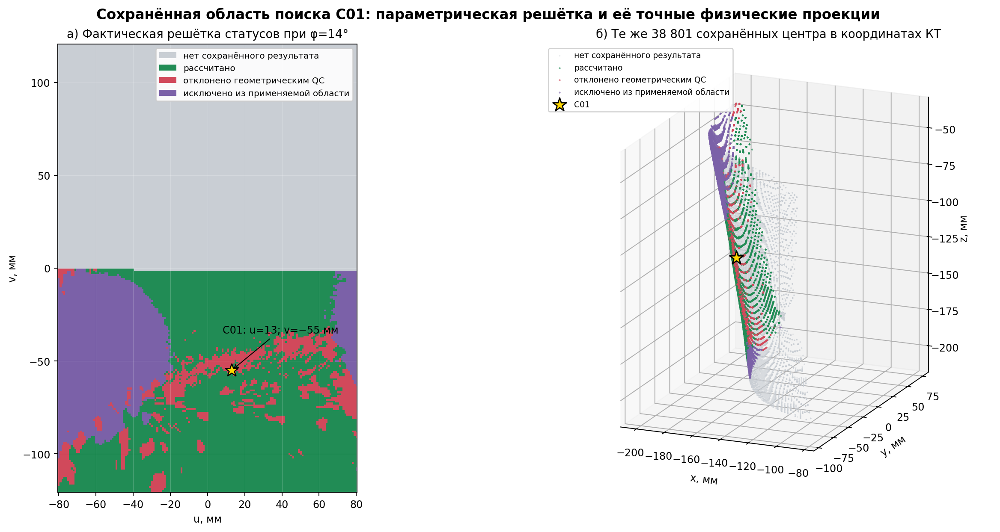

**Проверка входа рисунка.**

| параметр | диапазон / размер | смысл |
| --- | --- | --- |
| u | -80 … 80 мм | 161 значений, шаг 1 мм |
| v | -120 … 120 мм | 241 значение, шаг 1 мм |
| φ | -20 … 20° | 41 значение, шаг 1° |
| центры | 38801 | точные сохранённые проекции |
| позы | 1 590 841 | полная решётка centre×φ |

| статус | число поз |
| --- | --- |
| нет сохранённого результата | 803641 |
| рассчитано | 475090 |
| отклонено геометрическим QC | 95192 |
| исключено из применяемой области | 216918 |

In [6]:
# Геометрическая визуализация из сохранённых данных; FEM и новый поиск не запускаются.
from pathlib import Path
import sys

_revision_project = next(
    p for p in [Path.cwd().resolve(), *Path.cwd().resolve().parents]
    if (p / "MATLAB_TRKG4_real_subjects").is_dir()
)
_revision_notebooks = _revision_project / "MATLAB_TRKG4_real_subjects" / "notebooks"
if str(_revision_notebooks) not in sys.path:
    sys.path.insert(0, str(_revision_notebooks))
from revise_2010_geometry import display_revision_asset

display_revision_asset("search")


**Рисунок 3.3. Одна сохранённая область поиска в параметрических и физических координатах.** Слева показаны статусы узлов $(u,v)$ при $\varphi=14^\circ$; справа — их сохранённые проекции в системе КТ. Все координатные оси выражены в миллиметрах. Цвет обозначает категорию расчёта, а не ошибку импеданса: зелёный — рассчитанная поза, красный — отказ проверки контактов, фиолетовый — исключение маской поверхности, серый — отсутствие выполненной проверки.

Полезно сопоставлять границы цветных областей и положение звезды C01. Неправильная форма облака справа возникает при отображении параметрической сетки на поверхность тела; она не задаёт новую область поиска. Совпадающие проекции накладываются друг на друга. Ни цвет, ни плотность точек не являются вероятностью положения или картой чувствительности. В разделе 20 используется эта же сетка, но цветом показаны электрические критерии и, в некоторых панелях, минимум по углам.

<a id="electrode-section-c01"></a>
## 4. Продольное сечение по контактам текущей сборки C01

После задания области поиска необходимо проверить, как выбранная сборка располагается относительно кожи и лёгкого. Для этого строится один продольный срез по четырём сохранённым центроидам конечных контактов сборки $L=140$ мм. Это контакты численной CEM-модели; независимое измерение их фактического положения на теле отсутствует.

Четыре центроида на кривой поверхности не обязаны лежать в одной плоскости. Поэтому правило построения задаётся явно. Пусть $\mathbf r_{I+}$ и $\mathbf r_{I-}$ — центроиды токовых контактов. Выбираются середина хорды и единичное направление от $I-$ к $I+$:

$$
\mathbf p=\frac{\mathbf r_{I+}+\mathbf r_{I-}}2,\qquad
\mathbf a_0=\frac{\mathbf r_{I+}-\mathbf r_{I-}}
{\|\mathbf r_{I+}-\mathbf r_{I-}\|}.
$$

Для четырёх контактов сохранены локальные наружные нормали кожи $\mathbf n_e$. Их среднее задаёт направление внутрь $\mathbf b$. Проекция хорды на перпендикулярное ему направление задаёт продольную ось $\mathbf a$:

$$
\mathbf b=-\frac{\sum_e\mathbf n_e}{\|\sum_e\mathbf n_e\|},\qquad
\mathbf a=\frac{\mathbf a_0-(\mathbf a_0\cdot\mathbf b)\mathbf b}
{\|\mathbf a_0-(\mathbf a_0\cdot\mathbf b)\mathbf b\|},\qquad
\mathbf n_\Pi=\mathbf a\times\mathbf b .
$$

Плоскость натянута на хорду токовых контактов и среднее направление внутрь. Усреднение локальных нормалей — выбранное правило визуализации, а не независимое измерение нормали всей грудной стенки. Координаты среза обозначены $\tilde s,\tilde d$, чтобы отличить их от расчётного базиса $s,t,d$ в 20.16:

$$\mathbf r_\Pi=\mathbf p+\tilde s\,\mathbf a+\tilde d\,\mathbf b,\qquad
\ell_e=(\mathbf r_e-\mathbf p)\cdot\mathbf n_\Pi.$$

Здесь $\ell_e$ — знаковое расстояние центроида до плоскости, мм. Для $I+$ и $I-$ оно равно нулю по построению. Для потенциальных контактов получено $\ell(V+)=+0{,}332$ мм и $\ell(V-)=-1{,}819$ мм. Максимальное абсолютное отклонение равно 1,819 мм. Следовательно, изображать все четыре контакта как точно лежащие в срезе было бы неправильно.

В трёхмерной панели показаны центроиды, их проекции и плоскость. На двумерной панели цветные точки являются проекциями центроидов; контуры получены пересечением исходных STL-поверхностей этой плоскостью. Сердце и кости оставлены как анатомические ориентиры. В двухтканной электрической постановке они входят в общий фон $\rho_1$, а лёгкое имеет $\rho_2$.

Начало и направления этого иллюстративного среза отличаются от расчётного базиса 20.16. Подписанные расстояния относятся только к лучам данного рисунка. Направленная центральная толщина $h(0)=67{,}00$ мм, маски, контакты и рассчитанные импедансы 20.16 сохраняются. По срезу можно увидеть геометрическую неоднородность, но точность её электрического приближения проверяется отдельным сравнением операторов в разделе 11.4.

In [7]:
def plane_segments(tri, point, normal, basis_s, basis_d, tolerance=1e-7):
    signed = np.einsum('fvi,i->fv', tri - point, normal)
    candidate = tri[(signed.min(axis=1) <= tolerance) & (signed.max(axis=1) >= -tolerance)]
    candidate_signed = signed[(signed.min(axis=1) <= tolerance) & (signed.max(axis=1) >= -tolerance)]
    segments = []
    for face, distances in zip(candidate, candidate_signed):
        hits = []
        for i, j in ((0, 1), (1, 2), (2, 0)):
            di, dj = distances[i], distances[j]
            if abs(di) <= tolerance:
                hits.append(face[i])
            if di * dj < 0:
                t = di / (di - dj)
                hits.append(face[i] + t * (face[j] - face[i]))
        if len(hits) < 2:
            continue
        unique = np.unique(np.round(np.asarray(hits), 6), axis=0)
        if len(unique) < 2:
            continue
        if len(unique) > 2:
            distances_pair = np.linalg.norm(unique[:, None] - unique[None, :], axis=2)
            i, j = np.unravel_index(np.argmax(distances_pair), distances_pair.shape)
            unique = unique[[i, j]]
        relative = unique - point
        segments.append(np.column_stack((relative @ basis_s, relative @ basis_d)))
    return segments

s_grid = np.linspace(-95, 95, 381)
d_grid = np.linspace(-20, 135, 311)
S, D = np.meshgrid(s_grid, d_grid)
points = centre + S[..., None] * axis + D[..., None] * inward
if hu_interpolator is None:
    oblique_hu = None
else:
    queries = np.column_stack((
        points.reshape(-1, 3) @ direction_slices,
        points.reshape(-1, 3) @ direction_rows,
        points.reshape(-1, 3) @ direction_columns,
    ))
    oblique_hu = hu_interpolator(queries).reshape(D.shape)

section_segments = {
    key: plane_segments(value, centre, plane_normal, axis, inward)
    for key, value in triangles.items()
}

def contour_intersections_at_s(segments, s_value):
    depths = []
    for segment in segments:
        x0, y0 = segment[0]
        x1, y1 = segment[1]
        if (x0 - s_value) * (x1 - s_value) > 0 or abs(x1 - x0) < 1e-9:
            continue
        fraction = (s_value - x0) / (x1 - x0)
        if -1e-8 <= fraction <= 1 + 1e-8:
            depths.append(y0 + fraction * (y1 - y0))
    return np.asarray(depths)

def unique_sorted_depths(values, minimum_separation=1e-3):
    '''Collapse duplicate STL edge hits while retaining distinct branches.'''
    ordered = np.sort(np.asarray(values, dtype=float))
    ordered = ordered[np.isfinite(ordered)]
    if len(ordered) == 0:
        return ordered
    unique = [ordered[0]]
    for value in ordered[1:]:
        if value - unique[-1] > minimum_separation:
            unique.append(value)
    return np.asarray(unique)

# h in the displayed plane: choose the skin crossing nearest d=0 and the
# first lung crossing deeper than that skin point.
s_profile = np.arange(-80.0, 80.1, 2.0)
skin_profile = np.full_like(s_profile, np.nan)
lung_profile = np.full_like(s_profile, np.nan)
lung_crossings_by_s = []
for index, s_value in enumerate(s_profile):
    skin_hits = contour_intersections_at_s(section_segments['body'], s_value)
    if len(skin_hits) == 0:
        lung_crossings_by_s.append(np.asarray([], dtype=float))
        continue
    skin_profile[index] = skin_hits[np.argmin(np.abs(skin_hits))]
    lung_hits = contour_intersections_at_s(section_segments['lungs'], s_value)
    deeper = unique_sorted_depths(
        lung_hits[lung_hits > skin_profile[index] + 1.0])
    lung_crossings_by_s.append(deeper)
    if len(deeper):
        lung_profile[index] = deeper.min()
max_lung_branches = max((len(values) for values in lung_crossings_by_s), default=0)
lung_branch_profiles = np.full(
    (len(s_profile), max_lung_branches), np.nan, dtype=float)
for index, values in enumerate(lung_crossings_by_s):
    lung_branch_profiles[index, :len(values)] = values
h_plane = lung_profile - skin_profile
# This is a geometric skin-to-first-lung-boundary distance in the selected
# plane.  It is not a soft-tissue thickness unless every intervening tissue
# class has been explicitly segmented and removed from the path.
bone_crossings_by_s = []
for index, s_value in enumerate(s_profile):
    if not (np.isfinite(skin_profile[index]) and np.isfinite(lung_profile[index])):
        bone_crossings_by_s.append(np.asarray([], dtype=float))
        continue
    bone_hits = unique_sorted_depths(
        contour_intersections_at_s(section_segments['bones'], s_value))
    bone_crossings_by_s.append(bone_hits[
        (bone_hits > skin_profile[index] + 1.0)
        & (bone_hits < lung_profile[index] - 1.0)])
bone_path_flags = np.array([len(values) > 0 for values in bone_crossings_by_s])

projected140 = p140 - centre
electrode_s = projected140 @ axis
electrode_d = projected140 @ inward
electrode_lateral = projected140 @ plane_normal
skin_d_at_electrode_s = np.interp(electrode_s, s_profile, skin_profile)
h_plane_at_electrode_s = np.interp(electrode_s, s_profile, h_plane)
nearest_lung_from_patch = np.array([
    np.min(np.linalg.norm(lung_points - point, axis=1)) for point in p140
])


# revise_2010_geometry: legacy section calculations preserved; old STL/DICOM figure not rendered.
# The variables section_segments, electrode_s, electrode_d, h_plane and
# electrode_plane_table remain available to historical cells.

electrode_plane_table = pd.DataFrame({
    'электрод': grid140.electrode.to_numpy(),
    's проекции, мм': electrode_s,
    'd проекции, мм': electrode_d,
    'ℓ вне плоскости, мм': electrode_lateral,
    'd кожи в плоскости, мм': skin_d_at_electrode_s,
    'расстояние кожа–лёгкое в плоскости, мм': h_plane_at_electrode_s,
    'кость между кожей и лёгким в плоскости': np.interp(
        electrode_s, s_profile, bone_path_flags.astype(float)) > 0.5,
    '3D min до лёгкого от центроида, мм': nearest_lung_from_patch,
})

### 4.1. Что сечение позволяет установить

Плоскость через токовые контакты позволяет сопоставить продольное изменение анатомических границ и проверить отклонения потенциальных контактов. Она не описывает поперечную форму лёгкого и не задаёт область чувствительности. Электрическое сравнение должно использовать объёмные маски и согласованные условия на электродах.

Следующие разделы 5–10 сохраняют ход исследования раннего локального кандидата: определения толщины, обратную задачу и её численные ограничения. Их профили и параметры относятся к тому историческому положению, которое показано на рисунке 3.1. Текущее прямое сравнение C01 находится в разделе 11.4, а выбор C01 из сохранённого перебора — в разделе 20. Такое разделение необходимо, чтобы выводы старой инверсии не приписывались новой геометрии.

In [8]:
stl_fig, stl_ax = plt.subplots(figsize=(13, 8), facecolor='#101820')
stl_ax.set_facecolor('#101820')
stl_colors = {'body': '#ffd400', 'lungs': '#00e5ff', 'heart': '#ff4055', 'bones': '#ffffff'}
stl_widths = {'body': 3.8, 'lungs': 2.8, 'heart': 2.4, 'bones': 1.8}
stl_labels = {'body': 'наружная поверхность тела', 'lungs': 'лёгкие v3',
              'heart': 'сердце', 'bones': 'кости'}
for key in ('body', 'lungs', 'heart', 'bones'):
    stl_ax.add_collection(LineCollection(
        section_segments[key], colors=stl_colors[key], linewidths=stl_widths[key],
        label=stl_labels[key], zorder=2 if key == 'body' else 3
    ))

electrode_colors = ['#ff3b30', '#ff9500', '#34c759', '#0a84ff']
stl_ax.scatter(electrode_s, electrode_d, s=90, c=electrode_colors,
               edgecolor='black', linewidth=0.8, zorder=7, label='проекции электродов')
stl_ax.scatter(electrode_s, skin_d_at_electrode_s, s=90, marker='x', c='#ffd400',
               linewidths=2.5, zorder=8, label='кожа при том же s')
for x, y_projected, y_skin, label in zip(
        electrode_s, electrode_d, skin_d_at_electrode_s, grid140.electrode):
    stl_ax.plot([x, x], [y_projected, y_skin], color='#ffd400', ls='--', lw=1.2, alpha=0.9)
    stl_ax.annotate(label, (x, y_projected), xytext=(5, -14), textcoords='offset points',
                    color='white', weight='bold', zorder=9)

for s_mark in (-60, -30, 0, 30, 60):
    index = np.argmin(np.abs(s_profile - s_mark))
    if np.isfinite(h_plane[index]):
        stl_ax.plot([s_profile[index], s_profile[index]],
                    [skin_profile[index], lung_profile[index]], color='#39ff14', lw=3.0, zorder=6)
        stl_ax.text(s_profile[index] + 1.8,
                    0.5 * (skin_profile[index] + lung_profile[index]),
                    f'h={h_plane[index]:.1f} мм', color='#39ff14', fontsize=9,
                    rotation=90, va='center', zorder=9)

stl_ax.axhline(0, color='#ff2dff', ls=':', lw=1.2, label='центр / касательная кожи')
stl_ax.set_xlim(-95, 95)
stl_ax.set_ylim(135, -20)
stl_ax.set_aspect('equal', adjustable='box')
stl_ax.set_xlabel('$s$ вдоль общей оси электродов, мм', color='white')
stl_ax.set_ylabel('$d$ от кожи внутрь, мм', color='white')
stl_ax.set_title('STL-срез в плоскости электродов — геометрия, используемая FEM',
                 color='white', weight='bold')
stl_ax.tick_params(colors='white')
for spine in stl_ax.spines.values():
    spine.set_color('#b0bec5')
legend = stl_ax.legend(loc='lower right', ncol=2, facecolor='#18242e',
                       edgecolor='#b0bec5', framealpha=0.95)
for text_item in legend.get_texts():
    text_item.set_color('white')
stl_fig.tight_layout()

# revise_2010_geometry: old STL rendering closed; current figure is in §4.
plt.close(stl_fig)


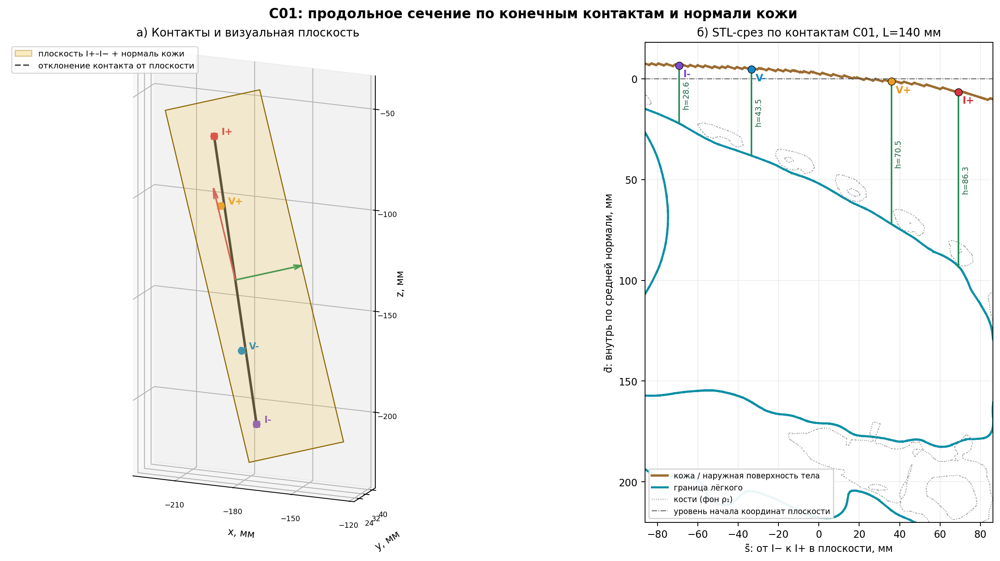

**Отклонения центроидов от визуальной плоскости.**

| электрод | s̃, мм | d̃, мм | ℓ, мм | |ℓ|, мм |
| --- | --- | --- | --- | --- |
| I+ | 69.178 | 6.579 | -0.000 | 0.000 |
| V+ | 35.968 | 1.272 | +0.332 | 0.332 |
| V- | -33.386 | -4.665 | -1.819 | 1.819 |
| I- | -69.178 | -6.579 | +0.000 | 0.000 |

Максимум |ℓ| = **1.819 мм**; h(0) расчётной модели = **67.00 мм** и не изменён.

In [9]:
# Геометрическая визуализация из сохранённых данных; FEM и новый поиск не запускаются.
from pathlib import Path
import sys

_revision_project = next(
    p for p in [Path.cwd().resolve(), *Path.cwd().resolve().parents]
    if (p / "MATLAB_TRKG4_real_subjects").is_dir()
)
_revision_notebooks = _revision_project / "MATLAB_TRKG4_real_subjects" / "notebooks"
if str(_revision_notebooks) not in sys.path:
    sys.path.insert(0, str(_revision_notebooks))
from revise_2010_geometry import display_revision_asset

display_revision_asset("section")


**Рисунок 4.1. Продольная плоскость и пересечение анатомических поверхностей для C01, $L=140$ мм.** Слева показаны центроиды конечных контактов, плоскость через токовые контакты и её локальные направления; пунктир соединяет потенциальные контакты с проекциями. Справа представлены контуры кожи, лёгкого, сердца и костей в этой же плоскости. Ось $\tilde s$ направлена от $I-$ к $I+$ после ортогонализации; $\tilde d$ — внутрь по средней локальной нормали. Координаты и подписанные расстояния выражены в миллиметрах.

Зелёные отрезки показывают расстояние от кожи до первого пересечения лёгкого вдоль выбранного направления. Следует сравнивать эти расстояния вдоль сборки и обращать внимание на дополнительные пересечения замкнутого лёгочного объёма. Одно постоянное $h$ такую геометрию полностью не описывает. Вместе с тем расстояние кожа–лёгкое может включать кости и другие ткани; оно не является измерением толщины одних мышц.

Отклонение потенциальных контактов от плоскости достигает 1,819 мм; это свойство сохранённой модели контактов, а не оценка ошибки экспериментальной наклейки. По одной плоскости нельзя установить распределение тока или величину вклада органов. Поэтому срез обосновывает геометрический вопрос, а ответ о точности импеданса и обратного восстановления требует последующих электрических расчётов.

Для чтения контактов слева показан небольшой фрагмент плоскости. Справа изображён участок до глубины 220 мм; нижний край окна является только границей изображения и не означает окончания лёгкого или расчётной области.